In [2]:
#import needed lib

In [3]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

In [4]:
#read the data

In [5]:
df=pd.read_csv("agri.csv")

In [6]:
#reading head
df.head()

,commodity_name,state,district,market,min_price,max_price,modal_price,date
0,Ajwan,Gujarat,Amreli,Amreli,63.25,79.55,79.55,2019-05-22
1,Ajwan,Gujarat,Banaskanth,Dhanera,80.05,80.05,80.05,2019-05-22
2,Ajwan,Gujarat,Jamnagar,Jamnagar,90.00,155.00,122.50,2019-05-22
3,Ajwan,Gujarat,Mehsana,Kadi,94.50,112.50,107.00,2019-05-22
4,Ajwan,Gujarat,Mehsana,Unjha,21.25,148.50,99.75,2019-05-22


In [7]:
#reading tail
df.tail()

,commodity_name,state,district,market,min_price,max_price,modal_price,date
836972,Arhar (Tur/Red Gram)(Whole),Gujarat,Bharuch,Jambusar(Kaavi),5100.0,5500.0,5300.0,06 Oct 2021
836973,Arhar (Tur/Red Gram)(Whole),Gujarat,Rajkot,Jasdan,3500.0,5500.0,5000.0,06 Oct 2021
836974,Arhar (Tur/Red Gram)(Whole),Gujarat,Rajkot,Rajkot,5300.0,6225.0,5650.0,06 Oct 2021
836975,Arhar (Tur/Red Gram)(Whole),Gujarat,Junagarh,Visavadar,4750.0,5750.0,5250.0,06 Oct 2021
836976,Arhar (Tur/Red Gram)(Whole),Kerala,Kasargod,Neeleswaram,10500.0,11500.0,11000.0,06 Oct 2021


In [8]:
#sanity check of the data(missing values,duplicate values,gap)


In [9]:
#shape of the data(no.of rows and col)
df.shape

(836977, 8)

In [10]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 836977 entries, 0 to 836976
Data columns (total 8 columns):
 #   Column          Non-Null Count   Dtype  
---  ------          --------------   -----  
 0   commodity_name  836976 non-null  object 
 1   state           836977 non-null  object 
 2   district        836977 non-null  object 
 3   market          836977 non-null  object 
 4   min_price       836976 non-null  float64
 5   max_price       836976 non-null  float64
 6   modal_price     836976 non-null  float64
 7   date            836976 non-null  object 
dtypes: float64(3), object(5)
memory usage: 51.1+ MB


In [11]:
#finding missing values
df.isnull().sum()

commodity_name    1
state             0
district          0
market            0
min_price         1
max_price         1
modal_price       1
date              1
dtype: int64

In [12]:
data2=df.copy()

In [13]:
#drop null valued rows
data2=data2.dropna()

In [14]:
data2.head()

,commodity_name,state,district,market,min_price,max_price,modal_price,date
0,Ajwan,Gujarat,Amreli,Amreli,63.25,79.55,79.55,2019-05-22
1,Ajwan,Gujarat,Banaskanth,Dhanera,80.05,80.05,80.05,2019-05-22
2,Ajwan,Gujarat,Jamnagar,Jamnagar,90.00,155.00,122.50,2019-05-22
3,Ajwan,Gujarat,Mehsana,Kadi,94.50,112.50,107.00,2019-05-22
4,Ajwan,Gujarat,Mehsana,Unjha,21.25,148.50,99.75,2019-05-22


In [15]:
data2.isnull().sum()

commodity_name    0
state             0
district          0
market            0
min_price         0
max_price         0
modal_price       0
date              0
dtype: int64

In [16]:
data2=data2.head(800000)

In [17]:
data2["date"][28]

'2019-05-22'

In [18]:
str=data2["date"][1]
str2=str.split('-')
print(str)
print(str2)
print(str2[1])

2019-05-22
['2019', '05', '22']
05


In [19]:
Dict={1:'january',2:'february',3:'march',4:'april',5:'may',6:'june',7:'july',8:'august',9:'september',10:'october',11:'november',12:'december'}
print(Dict)

{1: 'january', 2: 'february', 3: 'march', 4: 'april', 5: 'may', 6: 'june', 7: 'july', 8: 'august', 9: 'september', 10: 'october', 11: 'november', 12: 'december'}


In [20]:
Dict[1]

'january'

In [21]:
month_col=[]

In [22]:
for rr in data2["date"]:
    str =rr
    str2=str.split('-')
    month_col.append(Dict[int(str2[1])])

In [23]:
len(month_col)

800000

In [24]:
data2.loc[:,"month_col"]=month_col

In [25]:
data2["month_col"]

0          may
1          may
2          may
3          may
4          may
          ... 
799995    july
799996    july
799997    july
799998    july
799999    july
Name: month_col, Length: 800000, dtype: object

In [26]:
data2["month_col"].unique()

array(['may', 'june', 'july', 'august', 'september', 'october',
       'november', 'december', 'march', 'april'], dtype=object)

In [27]:
data2["commodity_name"].unique()

array(['Ajwan', 'Alasande+Gram', 'Amaranthus', 'Amla(Nelli+Kai)',
       'Amphophalus', 'Antawala', 'Apple', 'Arhar+Dal(Tur+Dal)',
       'Ashgourd', 'Avare+Dal', 'Banana', 'Banana+-+Green',
       'Barley+(Jau)', 'Beans', 'Beaten+Rice', 'Beetroot', 'Betal+Leaves',
       'Bitter+gourd', 'Black+pepper', 'Bottle+gourd', 'Brinjal',
       'Broken+Rice', 'Cabbage', 'Capsicum', 'Cardamoms', 'Carrot',
       'Cashewnuts', 'Castor+Seed', 'Cauliflower', 'Coconut',
       'Chapparad+Avare', 'Chennangi+Dal', 'Chikoos(Sapota)', 'Chili+Red',
       'Chilly+Capsicum', 'Cloves', 'Cluster+beans', 'Cocoa',
       'Coconut+Oil', 'Coconut+Seed', 'Coffee', 'Colacasia', 'Copra',
       'Coriander(Leaves)', 'Corriander+seed', 'Cowpea(Veg)', 'Cotton',
       'Cucumbar(Kheera)', 'Cummin+Seed(Jeera)', 'Drumstick',
       'Dry+Chillies', 'Dry+Fodder', 'Dry+Grapes', 'Duster+Beans', 'Egg',
       'Elephant+Yam+(Suran)', 'Field+Pea', 'Firewood', 'Fish', 'Garlic',
       'Ghee', 'Gingelly+Oil', 'Ginger(Dry)', 'Gi

In [28]:
number_of_commodity_names = data2["commodity_name"].nunique()
print(number_of_commodity_names)


243


In [29]:
number_of_states = data2["state"].nunique()
print(number_of_states)


29


In [30]:
# Group by state and aggregate the district information
state_district_info = data2.groupby('state')['district'].agg(
    num_districts='nunique', 
    district_names=lambda x: list(x.unique())
).reset_index()

# Display the information
print(state_district_info)


                  state  num_districts  \
0   Andaman and Nicobar              1   
1        Andhra Pradesh              9   
2                 Assam             18   
3           Chattisgarh             27   
4                   Goa              2   
5               Gujarat             27   
6               Haryana             21   
7      Himachal Pradesh             10   
8     Jammu and Kashmir              8   
9             Jharkhand              4   
10            Karnataka             25   
11               Kerala             14   
12       Madhya Pradesh             50   
13          Maharashtra             33   
14              Manipur              5   
15            Meghalaya              5   
16              Mizoram              1   
17         NCT of Delhi              1   
18             Nagaland             10   
19               Odisha             29   
20          Pondicherry              2   
21               Punjab             22   
22            Rajasthan           

In [31]:
# Assuming 'state_district_info' is your DataFrame
all_district_names = [district for sublist in state_district_info['district_names'] for district in sublist]

print(all_district_names)


['Nicobar', 'Kurnool', 'Cuddapah', 'Visakhapatnam', 'Chittor', 'East Godavari', 'West Godavari', 'Guntur', 'Vijayanagaram', 'Anantapur', 'Nalbari', 'Nagaon', 'Kamrup', 'Dhubri', 'Sonitpur', 'Cachar', 'Hailakandi', 'Goalpara', 'Karimganj', 'Lakhimpur', 'Barpeta', 'Jorhat', 'Kokrajhar', 'Bangaigaon', 'Darrang', 'Dibrugarh', 'Marigaon', 'Golaghat', 'Durg', 'Rajnandgaon', 'Narayanpur', 'Mahasamund', 'Kanker', 'Dhamtari', 'Raigarh', 'Dantewada', 'Jashpur', 'Korba', 'Bilaspur', 'Raipur', 'Janjgir', 'Balodabazar', 'Surguja', 'Koria', 'Surajpur', 'Balrampur', 'Bastar', 'Kabirdham', 'Sukma', 'Kondagaon', 'Balod', 'Gariyaband', 'Mungeli', 'Bijapur', 'Bemetara', 'North Goa', 'South Goa', 'Amreli', 'Banaskanth', 'Jamnagar', 'Mehsana', 'Narmada', 'Ahmedabad', 'Bharuch', 'Surat', 'Rajkot', 'Junagarh', 'Kheda', 'Dahod', 'Vadodara(Baroda)', 'Navsari', 'Valsad', 'Morbi', 'Kachchh', 'Bhavnagar', 'Surendranagar', 'Gandhinagar', 'Sabarkantha', 'Patan', 'Porbandar', 'Anand', 'Panchmahals', 'Botad', 'The Da

In [32]:
import pandas as pd

# Assuming data2 is your DataFrame
# data2 = pd.read_csv('path_to_your_large_dataset.csv')

# Function to get number of districts and their names for a particular state
def get_districts_for_state(df, state_name):
    # Filter the DataFrame for the particular state
    state_df = df[df['state'] == state_name]
    
    # Get unique districts
    unique_districts = state_df['district'].unique()
    
    # Number of unique districts
    num_districts = len(unique_districts)
    
    return num_districts, unique_districts

# Example usage
state_name = 'Karnataka'  # Replace with the desired state name
num_districts, district_names = get_districts_for_state(data2, state_name)

print(f"State: {state_name}")
print(f"Number of Districts: {num_districts}")
print(f"District Names: {', '.join(district_names)}")


State: Karnataka
Number of Districts: 25
District Names: Bagalkot, Bangalore, Gadag, Chikmagalur, Mysore, Shimoga, Kolar, Davangere, Madikeri(Kodagu), Udupi, Hassan, Tumkur, Bijapur, Dharwad, Raichur, Haveri, Chitradurga, Bellary, Bidar, Mandya, Belgaum, Karwar(Uttar Kannad), Koppal, Gulbarga, Chamrajnagar


In [33]:
import pandas as pd

# Assuming data2 is your DataFrame
# data2 = pd.read_csv('path_to_your_large_dataset.csv')

# Function to get number of districts and their names for a particular state
def get_districts_for_state(df, state_name):
    # Filter the DataFrame for the particular state
    state_df = df[df['state'] == state_name]
    
    # Get unique districts
    unique_districts = state_df['district'].unique()
    
    # Number of unique districts
    num_districts = len(unique_districts)
    
    return num_districts, unique_districts

# Example usage
state_name = 'Andaman and Nicobar'  # Replace with the desired state name
num_districts, district_names = get_districts_for_state(data2, state_name)

print(f"State: {state_name}")
print(f"Number of Districts: {num_districts}")
print(f"District Names: {', '.join(district_names)}")


State: Andaman and Nicobar
Number of Districts: 1
District Names: Nicobar


In [34]:
import pandas as pd

# Assuming data2 is your DataFrame
# data2 = pd.read_csv('path_to_your_large_dataset.csv')

# Function to get number of districts and their names for a particular state
def get_districts_for_state(df, state_name):
    # Filter the DataFrame for the particular state
    state_df = df[df['state'] == state_name]
    
    # Get unique districts
    unique_districts = state_df['district'].unique()
    
    # Number of unique districts
    num_districts = len(unique_districts)
    
    return num_districts, unique_districts

# Example usage
state_name = 'Andhra Pradesh'  # Replace with the desired state name
num_districts, district_names = get_districts_for_state(data2, state_name)

print(f"State: {state_name}")
print(f"Number of Districts: {num_districts}")
print(f"District Names: {', '.join(district_names)}")


State: Andhra Pradesh
Number of Districts: 9
District Names: Kurnool, Cuddapah, Visakhapatnam, Chittor, East Godavari, West Godavari, Guntur, Vijayanagaram, Anantapur


In [35]:
import pandas as pd

# Assuming data2 is your DataFrame
# data2 = pd.read_csv('path_to_your_large_dataset.csv')

# Function to get number of districts and their names for a particular state
def get_districts_for_state(df, state_name):
    # Filter the DataFrame for the particular state
    state_df = df[df['state'] == state_name]
    
    # Get unique districts
    unique_districts = state_df['district'].unique()
    
    # Number of unique districts
    num_districts = len(unique_districts)
    
    return num_districts, unique_districts

# Example usage
state_name = 'Assam'  # Replace with the desired state name
num_districts, district_names = get_districts_for_state(data2, state_name)

print(f"State: {state_name}")
print(f"Number of Districts: {num_districts}")
print(f"District Names: {', '.join(district_names)}")


State: Assam
Number of Districts: 18
District Names: Nalbari, Nagaon, Kamrup, Dhubri, Sonitpur, Cachar, Hailakandi, Goalpara, Karimganj, Lakhimpur, Barpeta, Jorhat, Kokrajhar, Bangaigaon, Darrang, Dibrugarh, Marigaon, Golaghat


In [36]:
import pandas as pd

# Assuming data2 is your DataFrame
# data2 = pd.read_csv('path_to_your_large_dataset.csv')

# Function to get number of districts and their names for a particular state
def get_districts_for_state(df, state_name):
    # Filter the DataFrame for the particular state
    state_df = df[df['state'] == state_name]
    
    # Get unique districts
    unique_districts = state_df['district'].unique()
    
    # Number of unique districts
    num_districts = len(unique_districts)
    
    return num_districts, unique_districts

# Example usage
state_name = 'Chattisgarh'  # Replace with the desired state name
num_districts, district_names = get_districts_for_state(data2, state_name)

print(f"State: {state_name}")
print(f"Number of Districts: {num_districts}")
print(f"District Names: {', '.join(district_names)}")


State: Chattisgarh
Number of Districts: 27
District Names: Durg, Rajnandgaon, Narayanpur, Mahasamund, Kanker, Dhamtari, Raigarh, Dantewada, Jashpur, Korba, Bilaspur, Raipur, Janjgir, Balodabazar, Surguja, Koria, Surajpur, Balrampur, Bastar, Kabirdham, Sukma, Kondagaon, Balod, Gariyaband, Mungeli, Bijapur, Bemetara


In [37]:
import pandas as pd

# Assuming data2 is your DataFrame
# data2 = pd.read_csv('path_to_your_large_dataset.csv')

# Function to get number of districts and their names for a particular state
def get_districts_for_state(df, state_name):
    # Filter the DataFrame for the particular state
    state_df = df[df['state'] == state_name]
    
    # Get unique districts
    unique_districts = state_df['district'].unique()
    
    # Number of unique districts
    num_districts = len(unique_districts)
    
    return num_districts, unique_districts

# Example usage
state_name = 'Goa'  # Replace with the desired state name
num_districts, district_names = get_districts_for_state(data2, state_name)

print(f"State: {state_name}")
print(f"Number of Districts: {num_districts}")
print(f"District Names: {', '.join(district_names)}")


State: Goa
Number of Districts: 2
District Names: North Goa, South Goa


In [38]:
import pandas as pd

# Assuming data2 is your DataFrame
# data2 = pd.read_csv('path_to_your_large_dataset.csv')

# Function to get number of districts and their names for a particular state
def get_districts_for_state(df, state_name):
    # Filter the DataFrame for the particular state
    state_df = df[df['state'] == state_name]
    
    # Get unique districts
    unique_districts = state_df['district'].unique()
    
    # Number of unique districts
    num_districts = len(unique_districts)
    
    return num_districts, unique_districts

# Example usage
state_name = 'Gujarat'  # Replace with the desired state name
num_districts, district_names = get_districts_for_state(data2, state_name)

print(f"State: {state_name}")
print(f"Number of Districts: {num_districts}")
print(f"District Names: {', '.join(district_names)}")


State: Gujarat
Number of Districts: 27
District Names: Amreli, Banaskanth, Jamnagar, Mehsana, Narmada, Ahmedabad, Bharuch, Surat, Rajkot, Junagarh, Kheda, Dahod, Vadodara(Baroda), Navsari, Valsad, Morbi, Kachchh, Bhavnagar, Surendranagar, Gandhinagar, Sabarkantha, Patan, Porbandar, Anand, Panchmahals, Botad, The Dangs


In [39]:
import pandas as pd

# Assuming data2 is your DataFrame
# data2 = pd.read_csv('path_to_your_large_dataset.csv')

# Function to get number of districts and their names for a particular state
def get_districts_for_state(df, state_name):
    # Filter the DataFrame for the particular state
    state_df = df[df['state'] == state_name]
    
    # Get unique districts
    unique_districts = state_df['district'].unique()
    
    # Number of unique districts
    num_districts = len(unique_districts)
    
    return num_districts, unique_districts

# Example usage
state_name = 'Haryana'  # Replace with the desired state name
num_districts, district_names = get_districts_for_state(data2, state_name)

print(f"State: {state_name}")
print(f"Number of Districts: {num_districts}")
print(f"District Names: {', '.join(district_names)}")


State: Haryana
Number of Districts: 21
District Names: Karnal, Faridabad, Hissar, Bhiwani, Kaithal, Fatehabad, Sonipat, Kurukshetra, Mahendragarh-Narnaul, Jind, Panipat, Sirsa, Rohtak, Yamuna Nagar, Panchkula, Ambala, Gurgaon, Mewat, Jhajar, Rewari, Palwal


In [40]:
import pandas as pd

# Assuming data2 is your DataFrame
# data2 = pd.read_csv('path_to_your_large_dataset.csv')

# Function to get number of districts and their names for a particular state
def get_districts_for_state(df, state_name):
    # Filter the DataFrame for the particular state
    state_df = df[df['state'] == state_name]
    
    # Get unique districts
    unique_districts = state_df['district'].unique()
    
    # Number of unique districts
    num_districts = len(unique_districts)
    
    return num_districts, unique_districts

# Example usage
state_name = 'Himachal Pradesh'  # Replace with the desired state name
num_districts, district_names = get_districts_for_state(data2, state_name)

print(f"State: {state_name}")
print(f"Number of Districts: {num_districts}")
print(f"District Names: {', '.join(district_names)}")


State: Himachal Pradesh
Number of Districts: 10
District Names: Mandi, Kangra, Sirmore, Solan, Kullu, Bilaspur, Chamba, Hamirpur, Shimla, Una


In [41]:
import pandas as pd

# Assuming data2 is your DataFrame
# data2 = pd.read_csv('path_to_your_large_dataset.csv')

# Function to get number of districts and their names for a particular state
def get_districts_for_state(df, state_name):
    # Filter the DataFrame for the particular state
    state_df = df[df['state'] == state_name]
    
    # Get unique districts
    unique_districts = state_df['district'].unique()
    
    # Number of unique districts
    num_districts = len(unique_districts)
    
    return num_districts, unique_districts

# Example usage
state_name = 'Jammu and Kashmir'  # Replace with the desired state name
num_districts, district_names = get_districts_for_state(data2, state_name)

print(f"State: {state_name}")
print(f"Number of Districts: {num_districts}")
print(f"District Names: {', '.join(district_names)}")


State: Jammu and Kashmir
Number of Districts: 8
District Names: Srinagar, Jammu, Udhampur, Anantnag, Kathua, Pulwama, Baramulla, Rajouri


In [42]:
import pandas as pd

# Assuming data2 is your DataFrame
# data2 = pd.read_csv('path_to_your_large_dataset.csv')

# Function to get number of districts and their names for a particular state
def get_districts_for_state(df, state_name):
    # Filter the DataFrame for the particular state
    state_df = df[df['state'] == state_name]
    
    # Get unique districts
    unique_districts = state_df['district'].unique()
    
    # Number of unique districts
    num_districts = len(unique_districts)
    
    return num_districts, unique_districts

# Example usage
state_name = 'Jharkhand'  # Replace with the desired state name
num_districts, district_names = get_districts_for_state(data2, state_name)

print(f"State: {state_name}")
print(f"Number of Districts: {num_districts}")
print(f"District Names: {', '.join(district_names)}")


State: Jharkhand
Number of Districts: 4
District Names: Garhwa, Giridih, Koderma, Lohardaga


In [43]:
import pandas as pd

# Assuming data2 is your DataFrame
# data2 = pd.read_csv('path_to_your_large_dataset.csv')

# Group by state and aggregate district information
state_district_info = data2.groupby('state')['district'].agg(
    district_names=lambda x: ', '.join(x.unique())
).reset_index()

# Optionally, you can add a column for the number of districts
state_district_info['num_districts'] = state_district_info['district_names'].apply(lambda x: len(x.split(', ')))

# Print the DataFrame
print(state_district_info)


                  state                                     district_names  \
0   Andaman and Nicobar                                            Nicobar   
1        Andhra Pradesh  Kurnool, Cuddapah, Visakhapatnam, Chittor, Eas...   
2                 Assam  Nalbari, Nagaon, Kamrup, Dhubri, Sonitpur, Cac...   
3           Chattisgarh  Durg, Rajnandgaon, Narayanpur, Mahasamund, Kan...   
4                   Goa                               North Goa, South Goa   
5               Gujarat  Amreli, Banaskanth, Jamnagar, Mehsana, Narmada...   
6               Haryana  Karnal, Faridabad, Hissar, Bhiwani, Kaithal, F...   
7      Himachal Pradesh  Mandi, Kangra, Sirmore, Solan, Kullu, Bilaspur...   
8     Jammu and Kashmir  Srinagar, Jammu, Udhampur, Anantnag, Kathua, P...   
9             Jharkhand                Garhwa, Giridih, Koderma, Lohardaga   
10            Karnataka  Bagalkot, Bangalore, Gadag, Chikmagalur, Mysor...   
11               Kerala  Ernakulam, Kollam, Thiruvananthapuram, 

In [44]:
import pandas as pd

# Assuming data2 is your DataFrame
# data2 = pd.read_csv('path_to_your_large_dataset.csv')

# Group by state and aggregate district information
state_district_info = data2.groupby('state')['district'].agg(
    district_names=lambda x: ', '.join(x.unique())
).reset_index()

# Optionally, add a column for the number of districts
state_district_info['num_districts'] = state_district_info['district_names'].apply(lambda x: len(x.split(', ')))

# Display the DataFrame
pd.set_option('display.max_colwidth', None)  # Ensure the column width is not truncated
print(state_district_info)


                  state  \
0   Andaman and Nicobar   
1        Andhra Pradesh   
2                 Assam   
3           Chattisgarh   
4                   Goa   
5               Gujarat   
6               Haryana   
7      Himachal Pradesh   
8     Jammu and Kashmir   
9             Jharkhand   
10            Karnataka   
11               Kerala   
12       Madhya Pradesh   
13          Maharashtra   
14              Manipur   
15            Meghalaya   
16              Mizoram   
17         NCT of Delhi   
18             Nagaland   
19               Odisha   
20          Pondicherry   
21               Punjab   
22            Rajasthan   
23           Tamil Nadu   
24            Telangana   
25              Tripura   
26        Uttar Pradesh   
27           Uttrakhand   
28          West Bengal   

                                                                                                                                                                                             

In [45]:
import pandas as pd

# Assuming data2 is your DataFrame
# data2 = pd.read_csv('path_to_your_large_dataset.csv')

# Group by state, district, and aggregate commodity information
state_district_commodities = data2.groupby(['state', 'district'])['commodity_name'].agg(
    num_commodities='nunique',  # Number of unique commodity names
    commodity_names=lambda x: ', '.join(x.unique())  # Unique commodity names as a comma-separated string
).reset_index()

# Optionally, if you want to display the DataFrame
pd.set_option('display.max_colwidth', None)  # Ensure the column width is not truncated
print(state_district_commodities)


                   state            district  num_commodities  \
0    Andaman and Nicobar             Nicobar               16   
1         Andhra Pradesh           Anantapur                5   
2         Andhra Pradesh             Chittor               19   
3         Andhra Pradesh            Cuddapah                2   
4         Andhra Pradesh       East Godavari                3   
..                   ...                 ...              ...   
483          West Bengal               Nadia               16   
484          West Bengal   North 24 Parganas                8   
485          West Bengal            Puruliya               13   
486          West Bengal  Sounth 24 Parganas               13   
487          West Bengal      Uttar Dinajpur                4   

                                                                                                                                                                                                                           

In [46]:
import pandas as pd

# Assuming data2 is your DataFrame
# data2 = pd.read_csv('path_to_your_large_dataset.csv')

# Group by district and aggregate number of unique crops (commodity names)
district_crops_count = data2.groupby('district')['commodity_name'].nunique().reset_index()

# Rename columns for clarity
district_crops_count.columns = ['District', 'Number of Crops']

# Display the DataFrame
print(district_crops_count)


         District  Number of Crops
0        Adilabad               15
1            Agra               47
2       Ahmedabad               40
3      Ahmednagar               60
4          Aizawl               33
..            ...              ...
478         Wokha               10
479  Yamuna Nagar               45
480      Yavatmal                6
481     Zunheboto               10
482    kapurthala               51

[483 rows x 2 columns]


In [47]:
import pandas as pd

# Assuming data2 is your DataFrame with columns 'state' and 'commodity_name'
# data2 = pd.read_csv('path_to_your_large_dataset.csv')

# Group by state and calculate the number of unique crops
state_crops_count = data2.groupby('state')['commodity_name'].nunique().reset_index()

# Rename columns for clarity
state_crops_count.columns = ['State', 'Number of Crops']

# Display the DataFrame
print(state_crops_count)


                  State  Number of Crops
0   Andaman and Nicobar               16
1        Andhra Pradesh               34
2                 Assam               39
3           Chattisgarh               83
4                   Goa               14
5               Gujarat              103
6               Haryana               78
7      Himachal Pradesh               65
8     Jammu and Kashmir               55
9             Jharkhand               29
10            Karnataka              121
11               Kerala               97
12       Madhya Pradesh              105
13          Maharashtra              114
14              Manipur               15
15            Meghalaya               43
16              Mizoram               33
17         NCT of Delhi               46
18             Nagaland               28
19               Odisha               89
20          Pondicherry               10
21               Punjab               97
22            Rajasthan               91
23           Tam

In [48]:
season_names=[]

In [49]:
for tt in data2["month_col"]:
    if tt=="january"or tt=="february":
        season_names.append("Winter")
    elif tt=="march"or tt=="april":
        season_names.append("Spring")
    elif tt=="may"or tt=="june":
        season_names.append("summer")
    elif tt=="july"or tt=="august":
        season_names.append("monsoon")
    elif tt=="september"or tt=="october":
        season_names.append("autum")
    elif tt=="november"or tt=="december":
        season_names.append("pre-winter")

In [50]:
data2.loc[:,"season_names"]=season_names

In [51]:
data2.head()

,commodity_name,state,district,market,min_price,max_price,modal_price,date,month_col,season_names
0,Ajwan,Gujarat,Amreli,Amreli,63.25,79.55,79.55,2019-05-22,may,summer
1,Ajwan,Gujarat,Banaskanth,Dhanera,80.05,80.05,80.05,2019-05-22,may,summer
2,Ajwan,Gujarat,Jamnagar,Jamnagar,90.00,155.00,122.50,2019-05-22,may,summer
3,Ajwan,Gujarat,Mehsana,Kadi,94.50,112.50,107.00,2019-05-22,may,summer
4,Ajwan,Gujarat,Mehsana,Unjha,21.25,148.50,99.75,2019-05-22,may,summer


In [52]:
import pandas as pd
df=pd.Timestamp("2019-04-12")
print(df.dayofweek)

4


In [53]:
day_of_week=[]

In [54]:
for rr in data2["date"]:
    str=rr
    df=pd.Timestamp(rr)
    day=df.dayofweek
    day_of_week.append(day)

In [55]:
len(day_of_week)

800000

In [56]:
data2.loc[:,"day"]=day_of_week

In [57]:
data2.tail()

,commodity_name,state,district,market,min_price,max_price,modal_price,date,month_col,season_names,day
799995,Pomegranate,Uttar Pradesh,Sultanpur,Sultanpur,47.5,49.0,48.0,2021-07-31,july,monsoon,5
799996,Bottle+gourd,Uttar Pradesh,Muzaffarnagar,Shamli,7.5,8.6,8.1,2021-07-13,july,monsoon,1
799997,Bottle+gourd,Uttar Pradesh,Balrampur,Utraula,14.8,16.5,15.7,2021-07-13,july,monsoon,1
799998,Arhar+Dal(Tur+Dal),Uttar Pradesh,Fatehpur,Bindki,95.0,96.3,95.8,2021-07-09,july,monsoon,4
799999,Bottle+gourd,Uttrakhand,Haridwar,Roorkee,6.0,10.0,8.5,2021-07-13,july,monsoon,1


In [58]:
print(data2.columns)


Index(['commodity_name', 'state', 'district', 'market', 'min_price',
       'max_price', 'modal_price', 'date', 'month_col', 'season_names', 'day'],
      dtype='object')


In [59]:
data2.tail()

,commodity_name,state,district,market,min_price,max_price,modal_price,date,month_col,season_names,day
799995,Pomegranate,Uttar Pradesh,Sultanpur,Sultanpur,47.5,49.0,48.0,2021-07-31,july,monsoon,5
799996,Bottle+gourd,Uttar Pradesh,Muzaffarnagar,Shamli,7.5,8.6,8.1,2021-07-13,july,monsoon,1
799997,Bottle+gourd,Uttar Pradesh,Balrampur,Utraula,14.8,16.5,15.7,2021-07-13,july,monsoon,1
799998,Arhar+Dal(Tur+Dal),Uttar Pradesh,Fatehpur,Bindki,95.0,96.3,95.8,2021-07-09,july,monsoon,4
799999,Bottle+gourd,Uttrakhand,Haridwar,Roorkee,6.0,10.0,8.5,2021-07-13,july,monsoon,1


In [60]:
data2=data2.drop('date',axis=1)

In [61]:
data2.columns

Index(['commodity_name', 'state', 'district', 'market', 'min_price',
       'max_price', 'modal_price', 'month_col', 'season_names', 'day'],
      dtype='object')

In [62]:
data2=data2.head(100000)

<Axes: ylabel='modal_price'>

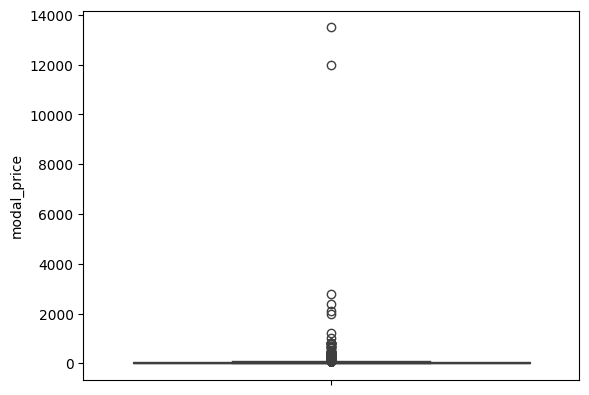

In [63]:
import seaborn as sns
sns.boxplot(data2['modal_price'])


In [64]:
data2.shape

(100000, 10)

In [65]:
data2['modal_price']

0         79.55
1         80.05
2        122.50
3        107.00
4         99.75
          ...  
99995     63.00
99996      5.00
99997     69.00
99998     30.20
99999     78.40
Name: modal_price, Length: 100000, dtype: float64

In [66]:
Q1=np.percentile(data2['modal_price'],25,interpolation="midpoint")
Q3=np.percentile(data2['modal_price'],75,interpolation="midpoint")
IQR=Q3-Q1

In [67]:
upper=np.where(data2['modal_price']>=(Q3+1.5*IQR))
lower=np.where(data2['modal_price']<=(Q1-1.5*IQR))

In [68]:
print(upper[0],lower[0])

[    0     1     2 ... 99986 99987 99999] []


In [69]:
#removing outliers
data2.drop(upper[0],inplace=True)
data2.drop(lower[0],inplace=True)
print("new shape:",data2.shape)

new shape: (94494, 10)


<Axes: ylabel='modal_price'>

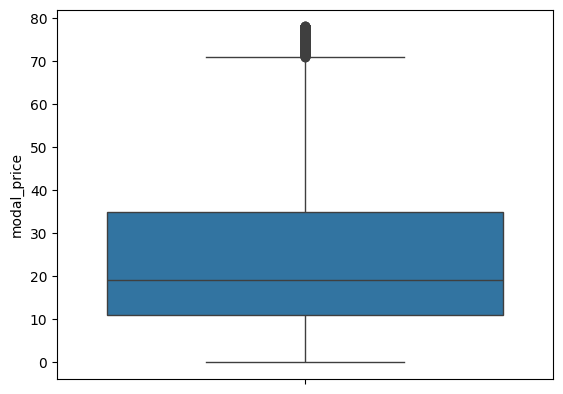

In [70]:
sns.boxplot(data2["modal_price"])

In [71]:
df=data2.copy()

In [72]:
data2.columns

Index(['commodity_name', 'state', 'district', 'market', 'min_price',
       'max_price', 'modal_price', 'month_col', 'season_names', 'day'],
      dtype='object')

In [73]:
import plotly.express as px

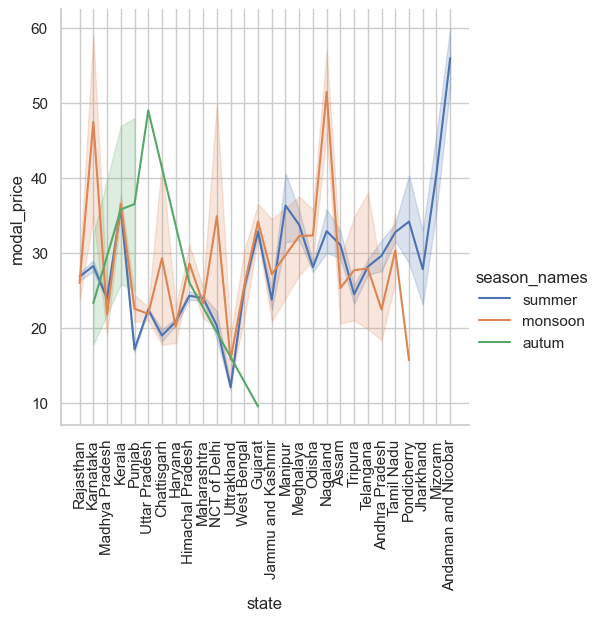

In [74]:
import seaborn as sns
import matplotlib.pyplot as plt

# Your seaborn relplot code
sns.set(style="whitegrid")
g = sns.relplot(data=df, x="state", y="modal_price", hue="season_names", kind="line")

# Rotate x-axis labels vertically
plt.xticks(rotation=90)

# Show the plot
plt.show()

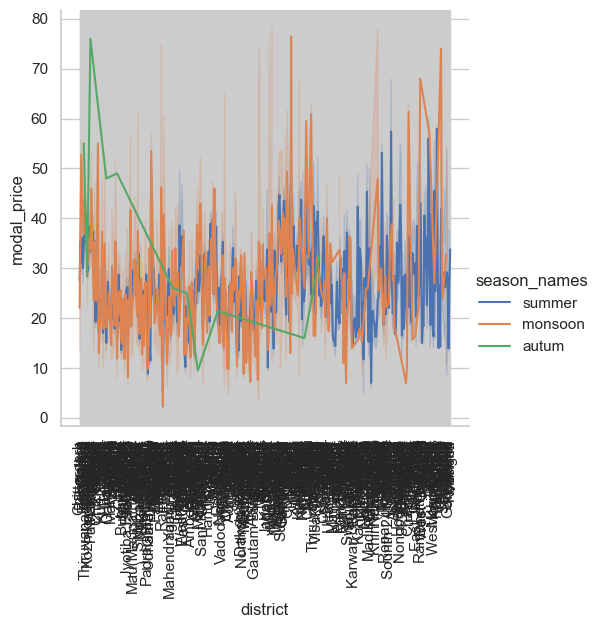

In [75]:
import seaborn as sns
import matplotlib.pyplot as plt

# Your seaborn relplot code
sns.set(style="whitegrid")
g = sns.relplot(data=df, x="district", y="modal_price", hue="season_names", kind="line")

# Rotate x-axis labels vertically
plt.xticks(rotation=90)

# Show the plot
plt.show()


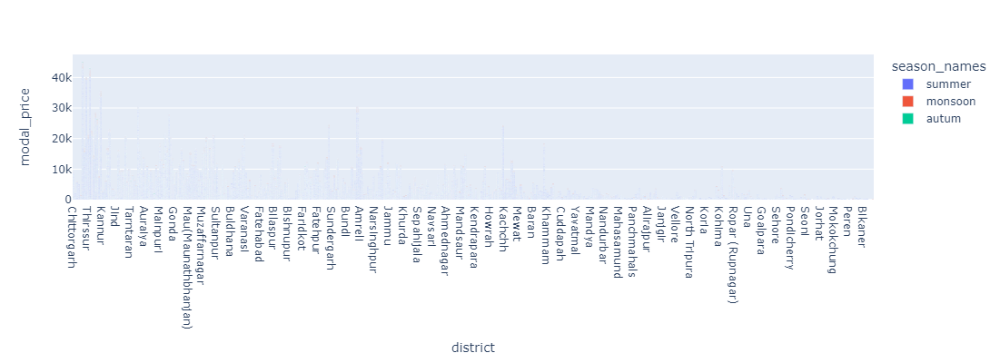

In [76]:
fig = px.bar(df,x="district",y="modal_price",color="season_names",height=400)
fig.show()

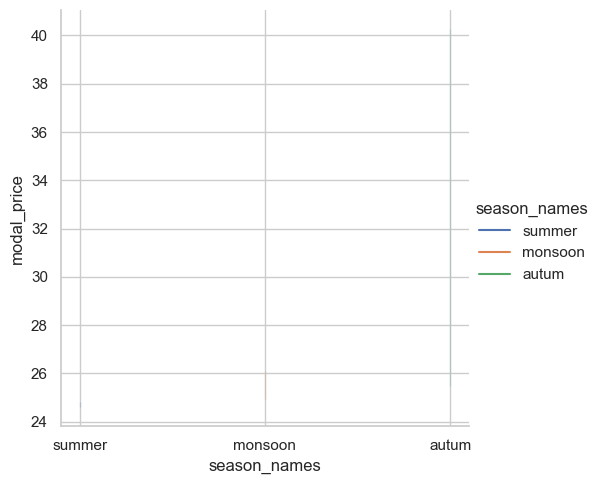

In [77]:
#relation btw season and price
sns.relplot(data=df,x="season_names",y="modal_price",hue="season_names",kind="line")

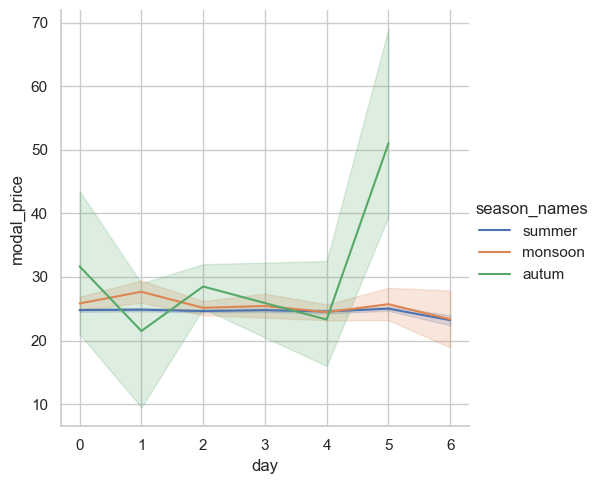

In [78]:
#relation btw day and price in week
sns.relplot(data=df,x="day",y="modal_price", hue="season_names", kind ="line")

In [79]:
data2.columns

Index(['commodity_name', 'state', 'district', 'market', 'min_price',
       'max_price', 'modal_price', 'month_col', 'season_names', 'day'],
      dtype='object')

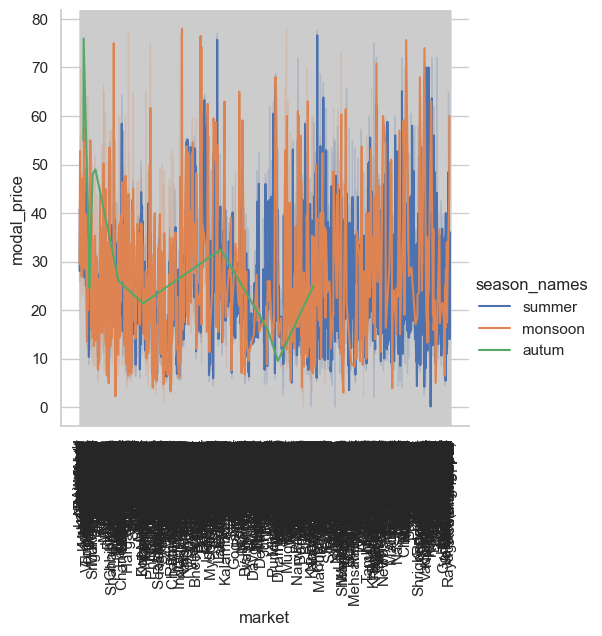

In [80]:
import seaborn as sns
import matplotlib.pyplot as plt

# Your seaborn relplot code
sns.set(style="whitegrid")
g = sns.relplot(data=df, x="market", y="modal_price", hue="season_names", kind="line")

# Rotate x-axis labels vertically
plt.xticks(rotation=90)

# Show the plot
plt.show()

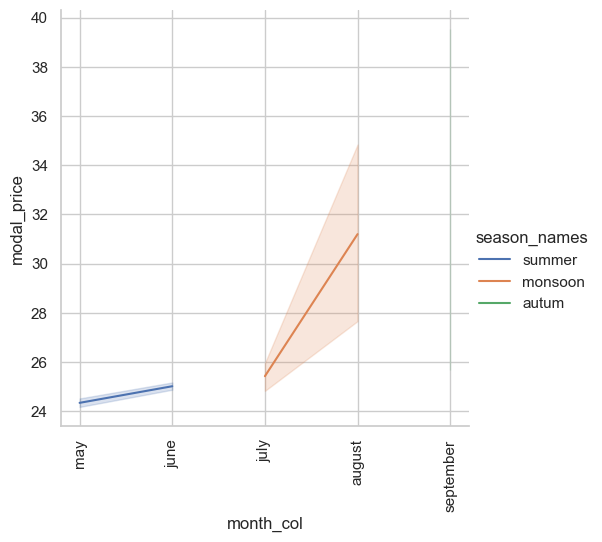

In [81]:
import seaborn as sns
import matplotlib.pyplot as plt

# Your seaborn relplot code

g = sns.relplot(data=df, x="month_col", y="modal_price", hue="season_names", kind="line")

# Rotate x-axis labels vertically
plt.xticks(rotation=90)

# Show the plot
plt.show()

In [82]:
data2.info()

<class 'pandas.core.frame.DataFrame'>
Index: 94494 entries, 6 to 99998
Data columns (total 10 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   commodity_name  94494 non-null  object 
 1   state           94494 non-null  object 
 2   district        94494 non-null  object 
 3   market          94494 non-null  object 
 4   min_price       94494 non-null  float64
 5   max_price       94494 non-null  float64
 6   modal_price     94494 non-null  float64
 7   month_col       94494 non-null  object 
 8   season_names    94494 non-null  object 
 9   day             94494 non-null  int64  
dtypes: float64(3), int64(1), object(6)
memory usage: 7.9+ MB


In [83]:
dist=(data2["district"])
distset=set(dist)
dd=list(distset)
dictofwords={ dd[i] : i for i in range(0, len(dd)) }
data2['district']=data2['district'].map(dictofwords)

In [84]:
dist=(data2["commodity_name"])
distset=set(dist)
dd=list(distset)
dictofwords={ dd[i] : i for i in range(0, len(dd)) }
data2['commodity_name']=data2['commodity_name'].map(dictofwords)

In [85]:
dist=(data2["market"])
distset=set(dist)
dd=list(distset)
dictofwords={ dd[i] : i for i in range(0, len(dd)) }
data2['market']=data2['market'].map(dictofwords)

In [86]:
dist=(data2["state"])
distset=set(dist)
dd=list(distset)
dictofwords={ dd[i] : i for i in range(0, len(dd)) }
data2['state']=data2['state'].map(dictofwords)

In [87]:
dist=(data2["month_col"])
distset=set(dist)
dd=list(distset)
dictofwords={ dd[i] : i for i in range(0, len(dd)) }
data2['month_col']=data2['month_col'].map(dictofwords)

In [88]:
dist=(data2["season_names"])
distset=set(dist)
dd=list(distset)
dictofwords={ dd[i] : i for i in range(0, len(dd)) }
data2['season_names']=data2['season_names'].map(dictofwords)

In [89]:
data2.info()

<class 'pandas.core.frame.DataFrame'>
Index: 94494 entries, 6 to 99998
Data columns (total 10 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   commodity_name  94494 non-null  int64  
 1   state           94494 non-null  int64  
 2   district        94494 non-null  int64  
 3   market          94494 non-null  int64  
 4   min_price       94494 non-null  float64
 5   max_price       94494 non-null  float64
 6   modal_price     94494 non-null  float64
 7   month_col       94494 non-null  int64  
 8   season_names    94494 non-null  int64  
 9   day             94494 non-null  int64  
dtypes: float64(3), int64(7)
memory usage: 7.9 MB


In [90]:
import matplotlib.pyplot as plt

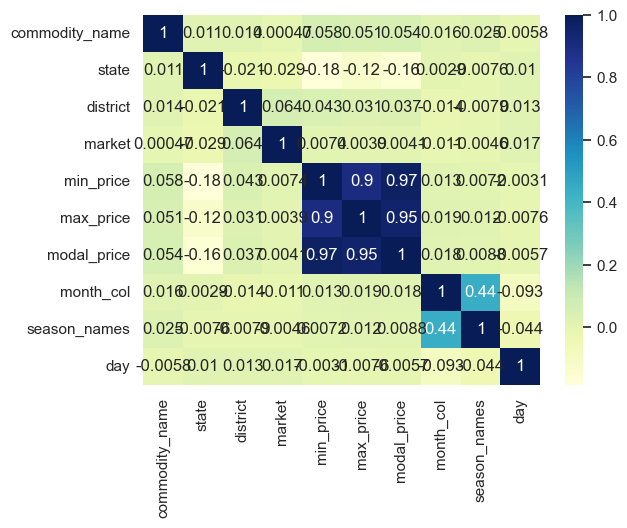

In [91]:
dataplot =sns.heatmap(data2.corr() ,cmap="YlGnBu",annot=True)
plt.show()

In [92]:
data2.columns

Index(['commodity_name', 'state', 'district', 'market', 'min_price',
       'max_price', 'modal_price', 'month_col', 'season_names', 'day'],
      dtype='object')

In [93]:
features =data2[[ 'commodity_name', 'state', 'district','market','month_col','season_names', 'day']]
labels=data2['modal_price']

In [94]:
from sklearn.model_selection import train_test_split
Xtrain,Xtest,Ytrain,Ytest = train_test_split(features,labels,test_size=0.2,random_state=2)

In [99]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import classification_report
from sklearn import metrics
from sklearn import tree

In [100]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.datasets import make_regression

regr=RandomForestRegressor(max_depth=1000,random_state=0)
regr.fit(Xtrain,Ytrain)

RandomForestRegressor(max_depth=1000, random_state=0)

In [101]:
y_pred=regr.predict(Xtest)

In [102]:
from sklearn.metrics import r2_score

In [103]:
r2_score(Ytest,y_pred)

0.9157291158240376

In [104]:
y_pred

array([ 9.7962    , 22.67335   ,  6.96633333, ..., 43.125     ,
       30.267     , 13.1035    ])

In [105]:
data2.columns

Index(['commodity_name', 'state', 'district', 'market', 'min_price',
       'max_price', 'modal_price', 'month_col', 'season_names', 'day'],
      dtype='object')

In [133]:
Xtest[8:20]

,commodity_name,state,district,market,month_col,season_names,day
11608,158,14,142,539,2,1,3
13660,171,12,36,1691,2,1,5
11455,171,12,25,898,2,1,4
26356,0,19,73,1109,2,1,0
91511,126,16,204,1187,3,1,4
21461,4,3,237,1121,2,1,4
19564,82,16,312,569,2,1,4
27087,110,17,133,1010,2,1,1
65631,65,7,23,1163,3,1,3
77996,119,12,108,472,3,1,5


In [134]:
user_input=[[3,143,1,14,43,13,14]]
regr.predict(user_input)

C:\Users\HP\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\base.py:493: UserWarning:

X does not have valid feature names, but RandomForestRegressor was fitted with feature names



array([29.3815])